<a href="https://colab.research.google.com/github/rheemaa-g/User-Persona-Identification/blob/main/Persona_Profiling_GC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Persona Profiling using K-Means Clustering

#### Data: 
          Primary Data Collected using Google forms.
#### Refrence Site: 
          Maqow (Online QnA)
#### Objectives: 
           1. To group respondents on the basis of their behavior on the site.
           2. To find the demographics of each group created.
           3. To analyze their journey on the site.

In [ ]:
#!pip uninstall pandas-profiling
#!pip install pandas-profiling[notebook,html]

In [ ]:
#Importing Libraries
import pandas as pd
import numpy as np
import sklearn as sk
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.cluster import KMeans
from pandas_profiling import ProfileReport

In [ ]:
from google.colab import files
uploaded = files.upload()

import io
og_data = pd.read_csv(io.BytesIO(uploaded['Persona Profiling.csv']), encoding='cp1252')
og_data.head()

Saving Persona Profiling.csv to Persona Profiling (6).csv


,Timestamp,AGE,OCCUPATION,ANNUAL INCOME,CITY,GENDER,INTERESTS,DAILY_HOUR_ONLINE,MOST_TIME_ON,PREV_SUBSCRIPTIONS,SCROLL,ABOUT_US,SUBSCRIBE,SEARCH,CAT_Internet,CAT_Technology,CAT_Finance,CAT_Health,CAT_Society,REGISTER,VOTE_ARTICLE,SHARE_MEDIA,LEAVE
0,07-09-2021 20:41,25,Student,0.0,mumbai,Male,Sports,6,"Instagram, Twitter, Google Browsing, LinkedIn",Yes,5,3,4,2,2,5,4,3,2,4,3,4,1
1,07-09-2021 22:16,21,Student,0.0,mumbai,Female,"Technology and Internet, Current Affairs",4,"Instagram, Google Browsing, YouTube",No,3,3,2,4,5,5,4,4,4,3,2,2,1
2,07-09-2021 22:18,21,Student,10000.0,mumbai,Female,"Sports, Music & Dance, Books & Movies, Politic...",2,"Instagram, Google Browsing",Yes,3,5,3,4,4,3,5,5,5,2,3,2,1
3,07-09-2021 22:20,22,Student,0.0,mumbai,Male,"Sports, Music & Dance, Books & Movies, Technol...",8,Instagram,No,5,3,4,5,5,5,5,5,5,3,4,5,3
4,07-09-2021 22:21,24,Student,0.0,mumbai,Male,"Sports, Technology and Internet, Current Affairs",4,"Twitter, Google Browsing, Youtube",Yes,5,2,1,4,1,5,5,1,1,1,5,1,1


In [ ]:
og_data.shape

(115, 23)

### _Sorting Dataset_

In [ ]:
#Dropping timestamp column
og_data = og_data.drop('Timestamp',axis=1)
og_data.head()

,AGE,OCCUPATION,ANNUAL INCOME,CITY,GENDER,INTERESTS,DAILY_HOUR_ONLINE,MOST_TIME_ON,PREV_SUBSCRIPTIONS,SCROLL,ABOUT_US,SUBSCRIBE,SEARCH,CAT_Internet,CAT_Technology,CAT_Finance,CAT_Health,CAT_Society,REGISTER,VOTE_ARTICLE,SHARE_MEDIA,LEAVE
0,25,Student,0.0,mumbai,Male,Sports,6,"Instagram, Twitter, Google Browsing, LinkedIn",Yes,5,3,4,2,2,5,4,3,2,4,3,4,1
1,21,Student,0.0,mumbai,Female,"Technology and Internet, Current Affairs",4,"Instagram, Google Browsing, YouTube",No,3,3,2,4,5,5,4,4,4,3,2,2,1
2,21,Student,10000.0,mumbai,Female,"Sports, Music & Dance, Books & Movies, Politic...",2,"Instagram, Google Browsing",Yes,3,5,3,4,4,3,5,5,5,2,3,2,1
3,22,Student,0.0,mumbai,Male,"Sports, Music & Dance, Books & Movies, Technol...",8,Instagram,No,5,3,4,5,5,5,5,5,5,3,4,5,3
4,24,Student,0.0,mumbai,Male,"Sports, Technology and Internet, Current Affairs",4,"Twitter, Google Browsing, Youtube",Yes,5,2,1,4,1,5,5,1,1,1,5,1,1


### _Correcting columns with ';'_

In [ ]:
###_Adding extra columns for 2nd_Interst & 3rd_Interest
###_Adding extra columns for 2nd_MostTimeOn & 3rd_MostTimeOn

#Defining function
def sep_new_col(data):
    '''
   Separates string at ; and returns separate columns in the form of a new dataframe
   '''
    new = data.str.split(',',n=3,expand=True)
    return new

In [ ]:
###_Adding extra columns for 2nd_Interst & 3rd_Interest
og_data['1stINTEREST'] = sep_new_col(og_data['INTERESTS'])[0]
og_data['2ndINTEREST'] = sep_new_col(og_data['INTERESTS'])[1]
og_data['3rdINTEREST'] = sep_new_col(og_data['INTERESTS'])[2]
og_data = og_data.drop('INTERESTS',axis=1)
og_data.columns

Index(['AGE', 'OCCUPATION', 'ANNUAL INCOME', 'CITY', 'GENDER',
       'DAILY_HOUR_ONLINE', 'MOST_TIME_ON', 'PREV_SUBSCRIPTIONS', 'SCROLL',
       'ABOUT_US', 'SUBSCRIBE', 'SEARCH', 'CAT_Internet', 'CAT_Technology',
       'CAT_Finance', 'CAT_Health', 'CAT_Society', 'REGISTER', 'VOTE_ARTICLE',
       'SHARE_MEDIA', 'LEAVE', '1stINTEREST', '2ndINTEREST', '3rdINTEREST'],
      dtype='object')

In [ ]:
###_Adding extra columns for 2nd_MostTimeOn & 3rd_MostTimeOn
og_data['1stMOSTTIMEON'] = sep_new_col(og_data['MOST_TIME_ON'])[0]
og_data['2ndMOSTTIMEON'] = sep_new_col(og_data['MOST_TIME_ON'])[1]
og_data['3rdMOSTTIMEON'] = sep_new_col(og_data['MOST_TIME_ON'])[2]
og_data = og_data.drop('MOST_TIME_ON',axis=1)
og_data.columns

Index(['AGE', 'OCCUPATION', 'ANNUAL INCOME', 'CITY', 'GENDER',
       'DAILY_HOUR_ONLINE', 'PREV_SUBSCRIPTIONS', 'SCROLL', 'ABOUT_US',
       'SUBSCRIBE', 'SEARCH', 'CAT_Internet', 'CAT_Technology', 'CAT_Finance',
       'CAT_Health', 'CAT_Society', 'REGISTER', 'VOTE_ARTICLE', 'SHARE_MEDIA',
       'LEAVE', '1stINTEREST', '2ndINTEREST', '3rdINTEREST', '1stMOSTTIMEON',
       '2ndMOSTTIMEON', '3rdMOSTTIMEON'],
      dtype='object')

### _Exploring Data_

In [ ]:
og_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 26 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   AGE                 115 non-null    int64  
 1   OCCUPATION          115 non-null    object 
 2   ANNUAL INCOME       97 non-null     float64
 3   CITY                115 non-null    object 
 4   GENDER              115 non-null    object 
 5   DAILY_HOUR_ONLINE   115 non-null    int64  
 6   PREV_SUBSCRIPTIONS  115 non-null    object 
 7   SCROLL              115 non-null    int64  
 8   ABOUT_US            115 non-null    int64  
 9   SUBSCRIBE           115 non-null    int64  
 10  SEARCH              115 non-null    int64  
 11  CAT_Internet        115 non-null    int64  
 12  CAT_Technology      115 non-null    int64  
 13  CAT_Finance         115 non-null    int64  
 14  CAT_Health          115 non-null    int64  
 15  CAT_Society         115 non-null    int64  
 16  REGISTER

In [ ]:
og_data.isnull().sum()

AGE                    0
OCCUPATION             0
ANNUAL INCOME         18
CITY                   0
GENDER                 0
DAILY_HOUR_ONLINE      0
PREV_SUBSCRIPTIONS     0
SCROLL                 0
ABOUT_US               0
SUBSCRIBE              0
SEARCH                 0
CAT_Internet           0
CAT_Technology         0
CAT_Finance            0
CAT_Health             0
CAT_Society            0
REGISTER               0
VOTE_ARTICLE           0
SHARE_MEDIA            0
LEAVE                  0
1stINTEREST            0
2ndINTEREST           25
3rdINTEREST           40
1stMOSTTIMEON          0
2ndMOSTTIMEON         33
3rdMOSTTIMEON         75
dtype: int64

### _Annual Income Imputation_

In [ ]:
#Replacing with mean
mean_income = int(np.mean(og_data['ANNUAL INCOME']))
og_data['ANNUAL INCOME'] = og_data['ANNUAL INCOME'].fillna(mean_income)
og_data.isnull().sum()

AGE                    0
OCCUPATION             0
ANNUAL INCOME          0
CITY                   0
GENDER                 0
DAILY_HOUR_ONLINE      0
PREV_SUBSCRIPTIONS     0
SCROLL                 0
ABOUT_US               0
SUBSCRIBE              0
SEARCH                 0
CAT_Internet           0
CAT_Technology         0
CAT_Finance            0
CAT_Health             0
CAT_Society            0
REGISTER               0
VOTE_ARTICLE           0
SHARE_MEDIA            0
LEAVE                  0
1stINTEREST            0
2ndINTEREST           25
3rdINTEREST           40
1stMOSTTIMEON          0
2ndMOSTTIMEON         33
3rdMOSTTIMEON         75
dtype: int64

In [ ]:
og_data.describe()

,AGE,ANNUAL INCOME,DAILY_HOUR_ONLINE,SCROLL,ABOUT_US,SUBSCRIBE,SEARCH,CAT_Internet,CAT_Technology,CAT_Finance,CAT_Health,CAT_Society,REGISTER,VOTE_ARTICLE,SHARE_MEDIA,LEAVE
count,115.000000,1.150000e+02,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000,115.000000
mean,38.339130,3.886238e+05,5.930435,3.843478,3.286957,2.930435,3.513043,3.434783,3.339130,3.200000,3.408696,3.200000,2.765217,3.182609,3.426087,2.721739
std,91.277665,1.115140e+06,3.937498,1.288214,1.309649,1.361898,1.259109,1.305390,1.303753,1.352061,1.330451,1.364975,1.397557,1.341527,1.291408,1.478191
min,17.000000,-1.000000e+04,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,22.000000,0.000000e+00,3.000000,3.000000,2.000000,2.000000,3.000000,3.000000,2.000000,2.000000,2.000000,2.000000,1.000000,2.000000,2.500000,1.000000
50%,23.000000,2.000000e+04,5.000000,4.000000,4.000000,3.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000,3.000000,3.000000,3.000000,3.000000
75%,40.000000,3.886230e+05,8.000000,5.000000,4.000000,4.000000,5.000000,4.500000,4.000000,4.000000,4.500000,4.000000,4.000000,4.000000,5.000000,4.000000
max,999.000000,1.000000e+07,24.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


### _K-Means Clustering_

In [ ]:
#Initializing
km = KMeans(n_clusters=8)

#Predicting Clusters
clusters = km.fit_predict(og_data[['SCROLL', 'ABOUT_US', 'SUBSCRIBE', 'SEARCH', 'CAT_Internet', 'CAT_Technology', 'CAT_Finance', 'CAT_Health', 'CAT_Society', 'REGISTER', 'VOTE_ARTICLE', 'SHARE_MEDIA', 'LEAVE']])
clusters

array([3, 6, 6, 2, 3, 4, 3, 1, 2, 2, 0, 6, 5, 7, 2, 0, 2, 5, 0, 4, 1, 7,
       7, 4, 6, 3, 0, 3, 3, 3, 3, 4, 2, 6, 1, 2, 2, 3, 1, 1, 0, 2, 2, 1,
       3, 7, 6, 2, 3, 1, 0, 3, 1, 7, 7, 6, 2, 2, 1, 7, 7, 2, 2, 2, 2, 1,
       1, 4, 4, 2, 2, 2, 6, 7, 6, 5, 6, 2, 4, 4, 3, 2, 4, 1, 6, 1, 4, 2,
       2, 2, 4, 2, 7, 6, 6, 3, 4, 3, 3, 5, 4, 2, 2, 4, 2, 1, 2, 4, 5, 1,
       4, 2, 3, 4, 4], dtype=int32)

In [ ]:
#Adding in og_data
og_data['Clusters(k=8)'] = clusters
og_data.head()

,AGE,OCCUPATION,ANNUAL INCOME,CITY,GENDER,DAILY_HOUR_ONLINE,PREV_SUBSCRIPTIONS,SCROLL,ABOUT_US,SUBSCRIBE,SEARCH,CAT_Internet,CAT_Technology,CAT_Finance,CAT_Health,CAT_Society,REGISTER,VOTE_ARTICLE,SHARE_MEDIA,LEAVE,1stINTEREST,2ndINTEREST,3rdINTEREST,1stMOSTTIMEON,2ndMOSTTIMEON,3rdMOSTTIMEON,Clusters(k=8)
0,25,Student,0.0,mumbai,Male,6,Yes,5,3,4,2,2,5,4,3,2,4,3,4,1,Sports,None,None,Instagram,Twitter,Google Browsing,3
1,21,Student,0.0,mumbai,Female,4,No,3,3,2,4,5,5,4,4,4,3,2,2,1,Technology and Internet,Current Affairs,None,Instagram,Google Browsing,YouTube,6
2,21,Student,10000.0,mumbai,Female,2,Yes,3,5,3,4,4,3,5,5,5,2,3,2,1,Sports,Music & Dance,Books & Movies,Instagram,Google Browsing,None,6
3,22,Student,0.0,mumbai,Male,8,No,5,3,4,5,5,5,5,5,5,3,4,5,3,Sports,Music & Dance,Books & Movies,Instagram,None,None,2
4,24,Student,0.0,mumbai,Male,4,Yes,5,2,1,4,1,5,5,1,1,1,5,1,1,Sports,Technology and Internet,Current Affairs,Twitter,Google Browsing,Youtube,3


### _Elbow Method Evaluation_

In [ ]:
sse = []
k_rng = range(1,10)
for k in k_rng:
    km = KMeans(n_clusters=k)
    km.fit(og_data[['SCROLL', 'ABOUT_US', 'SUBSCRIBE', 'SEARCH', 'CAT_Internet', 'CAT_Technology', 'CAT_Finance', 'CAT_Health', 'CAT_Society', 'REGISTER', 'VOTE_ARTICLE', 'SHARE_MEDIA', 'LEAVE']])
    sse.append(km.inertia_)

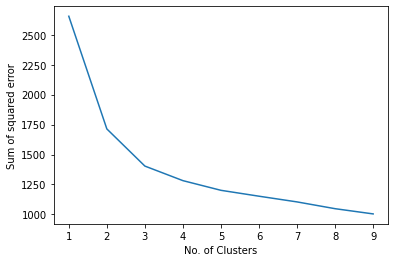

In [ ]:
#Plotting 
plt.xlabel('No. of Clusters')
plt.ylabel('Sum of squared error')
plt.plot(k_rng,sse)

In [ ]:
#Initializing
km1 = KMeans(n_clusters=5)

#Predicting Clusters
clusters1 = km1.fit_predict(og_data[['SCROLL', 'ABOUT_US', 'SUBSCRIBE', 'SEARCH', 'CAT_Internet', 'CAT_Technology', 'CAT_Finance', 'CAT_Health', 'CAT_Society', 'REGISTER', 'VOTE_ARTICLE', 'SHARE_MEDIA', 'LEAVE']])
clusters1

array([4, 4, 4, 2, 3, 0, 4, 1, 2, 2, 2, 4, 1, 1, 2, 4, 2, 1, 4, 0, 1, 1,
       1, 0, 0, 4, 0, 4, 4, 4, 4, 0, 2, 0, 1, 2, 2, 4, 3, 3, 4, 2, 2, 1,
       4, 1, 3, 2, 4, 3, 0, 3, 3, 1, 1, 3, 2, 2, 3, 1, 1, 2, 2, 2, 2, 3,
       3, 0, 0, 2, 2, 2, 4, 1, 0, 1, 4, 2, 0, 0, 4, 2, 0, 3, 3, 3, 0, 2,
       2, 2, 0, 2, 1, 4, 4, 4, 0, 4, 4, 1, 0, 2, 2, 0, 2, 3, 2, 0, 1, 3,
       0, 2, 4, 0, 0], dtype=int32)

In [ ]:
#Adding in og_data
og_data['Clusters(k=5)'] = clusters1
og_data.head()

,AGE,OCCUPATION,ANNUAL INCOME,CITY,GENDER,DAILY_HOUR_ONLINE,PREV_SUBSCRIPTIONS,SCROLL,ABOUT_US,SUBSCRIBE,SEARCH,CAT_Internet,CAT_Technology,CAT_Finance,CAT_Health,CAT_Society,REGISTER,VOTE_ARTICLE,SHARE_MEDIA,LEAVE,1stINTEREST,2ndINTEREST,3rdINTEREST,1stMOSTTIMEON,2ndMOSTTIMEON,3rdMOSTTIMEON,Clusters(k=8),Clusters(k=5)
0,25,Student,0.0,mumbai,Male,6,Yes,5,3,4,2,2,5,4,3,2,4,3,4,1,Sports,None,None,Instagram,Twitter,Google Browsing,3,4
1,21,Student,0.0,mumbai,Female,4,No,3,3,2,4,5,5,4,4,4,3,2,2,1,Technology and Internet,Current Affairs,None,Instagram,Google Browsing,YouTube,6,4
2,21,Student,10000.0,mumbai,Female,2,Yes,3,5,3,4,4,3,5,5,5,2,3,2,1,Sports,Music & Dance,Books & Movies,Instagram,Google Browsing,None,6,4
3,22,Student,0.0,mumbai,Male,8,No,5,3,4,5,5,5,5,5,5,3,4,5,3,Sports,Music & Dance,Books & Movies,Instagram,None,None,2,2
4,24,Student,0.0,mumbai,Male,4,Yes,5,2,1,4,1,5,5,1,1,1,5,1,1,Sports,Technology and Internet,Current Affairs,Twitter,Google Browsing,Youtube,3,3


### _Separating dataframes based on Clusters_

In [ ]:
clusters_1 = og_data[og_data['Clusters(k=5)']==0].drop(['Clusters(k=8)'],axis=1)
clusters_2 = og_data[og_data['Clusters(k=5)']==1].drop(['Clusters(k=8)'],axis=1)
clusters_3 = og_data[og_data['Clusters(k=5)']==2].drop(['Clusters(k=8)'],axis=1)
clusters_4 = og_data[og_data['Clusters(k=5)']==3].drop(['Clusters(k=8)'],axis=1)
clusters_5 = og_data[og_data['Clusters(k=5)']==4].drop(['Clusters(k=8)'],axis=1)

### _Creating Reports_

In [ ]:
profile = ProfileReport(clusters_1, title='Persona 1',html={'style' : {'full_width':True}})
#profile.to_file("Persona 1.html")
profile

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile1 = ProfileReport(clusters_2, title='Persona 2',html={'style' : {'full_width':True}})
#profile1.to_file("Persona 2.html")
profile1

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile2 = ProfileReport(clusters_3, title='Persona 3',html={'style' : {'full_width':True}})
#profile2.to_file("Persona 3.html")
profile2

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile3 = ProfileReport(clusters_4, title='Persona 4',html={'style' : {'full_width':True}})
#profile3.to_file("Persona 4.html")
profile3

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile4 = ProfileReport(clusters_5, title='Persona 5',html={'style' : {'full_width':True}})
#profile4.to_file("Persona 5.html")
profile4

Summarize dataset:   0%|          | 0/41 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]